In [1]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import time

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
device

'cpu'

## Neural Network Model

In [2]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
        nn.Linear(1,10),
        nn.Sigmoid(),
        nn.Linear(10,1, bias=False)
        )
        
    def forward(self, x):
        N = self.layers(x)
        return N

In [3]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 2)
    optimizer.step(closure)   

### Differential equation
$$\frac{d^2\phi(r)}{dr^2} + \frac{2m}{\hbar^2}\left(E-\frac{l(l+1)}{2mr^2}\hbar^2+V(r)\right)\phi(r) = 0$$ 
Dataset are vectors of domain of differential equation, like the vectors are one-dimentional, the shape of dataset is one by m samples. Trial solution $\phi_t(r) = e^{-\beta r^2}N(r,\vec{p})$, with $\phi(r=0) = 0$ and $\phi(r\rightarrow\infty) = 0$ as boundary conditions.  

In [4]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: r*torch.exp(-beta*r) * model.forward(r)

In [5]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [6]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)    
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6

    prom = Phi.size()[0]
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [7]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 2e-2
Phis_t = []
Es = []
lss = []
epochs = []



start = time.time()

model = NeuralNetwork().to(device)
initialize_weights(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
for t in range(epoch+1):
    loss = loss_fn(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
    training(R_train, loss_fn, optimizer)
    if t%100 == 0:
        Phis_t.append(Phi_t(R_train).detach().numpy())
        Es.append(E.detach().numpy())
        lss.append(loss.detach().numpy())
        epochs.append(t)
Es = np.squeeze(Es)
lss = np.squeeze(lss)
Phis_t = np.squeeze(Phis_t)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([210.7116], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([177.7217], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([153.9795], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([134.9216], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([118.5355], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([103.7978], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([90.0661], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([76.8881], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([63.9468], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([51.0579], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([38.2151], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([25.7129], grad_fn=<DivBackward0>)
Epoch 13
 ---------------------

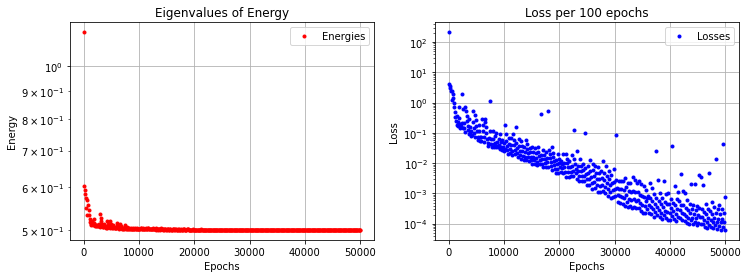

In [8]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs, 1+Es, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs, lss, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

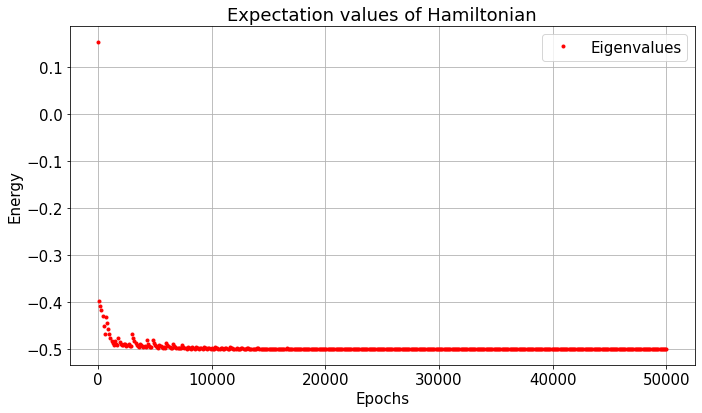

In [10]:
plt.figure(figsize=(10,6))
plt.plot(epochs, Es, "r.", label="Eigenvalues")
plt.title("Expectation values of Hamiltonian")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.tight_layout()
plt.rc("font", size=15)
plt.savefig("eigenvalue.png", dpi=600)
plt.show()

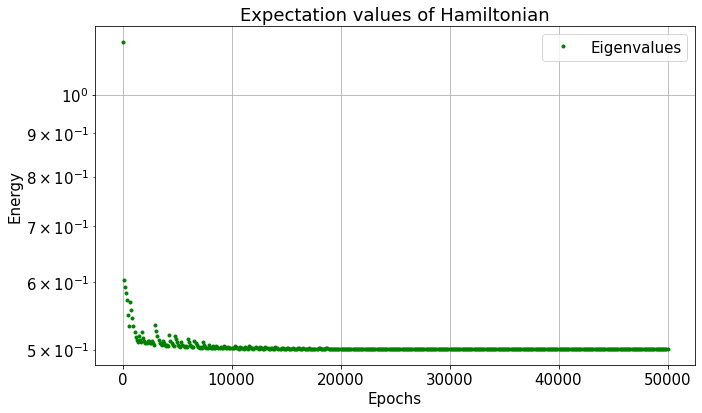

In [11]:
plt.figure(figsize=(10,6))
plt.plot(epochs, 1+Es, "g.", label="Eigenvalues")
plt.title("Expectation values of Hamiltonian")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.tight_layout()
plt.savefig("eigenvalue_1.png", dpi=600)
plt.show()

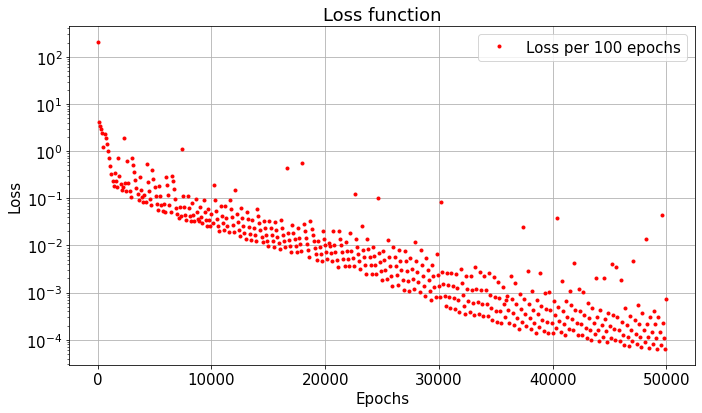

In [12]:
plt.figure(figsize=(10,6))
plt.plot(epochs, lss, "r.", label="Loss per 100 epochs")
plt.title("Loss function")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.tight_layout()
plt.rc("font", size=15)
plt.savefig("loss.png", dpi=600)
plt.show()

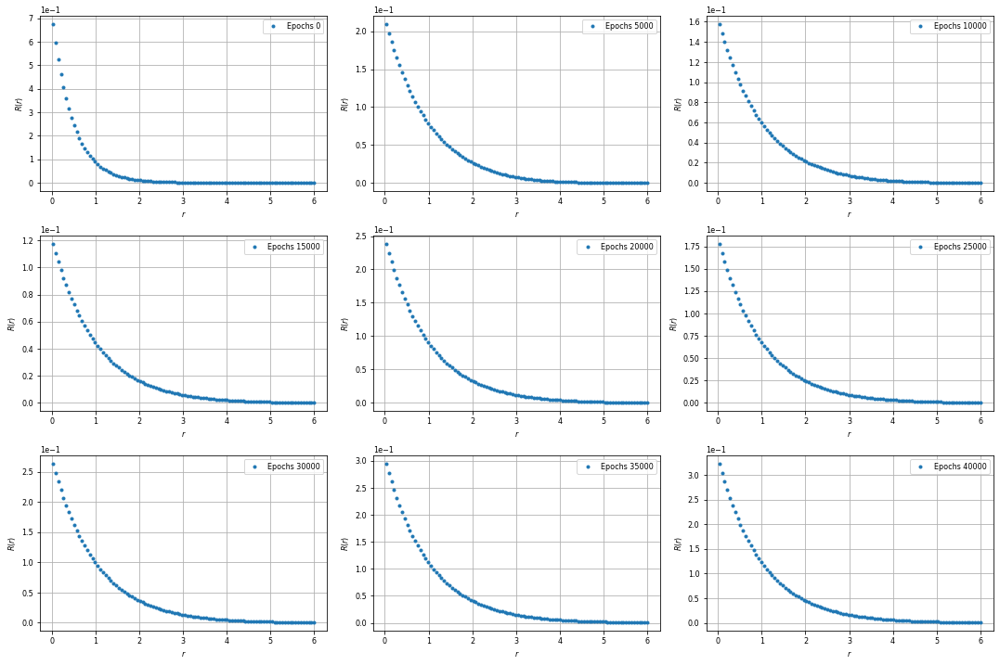

In [14]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.rc("font", size=8)
plt.tight_layout()
plt.show()  

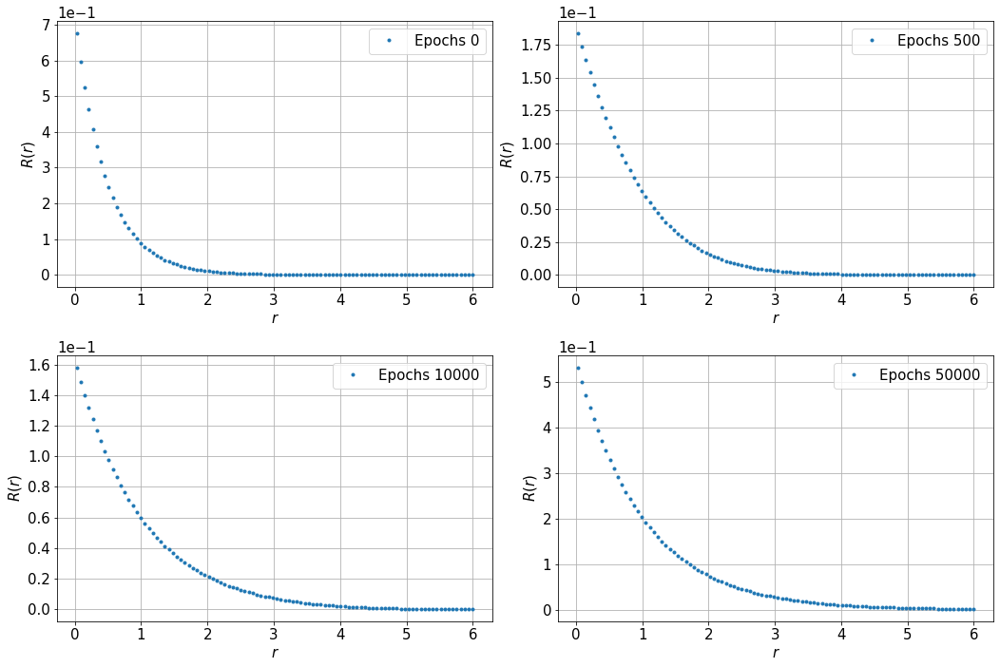

In [17]:
graphs = [0,5,100,500]
fig, axs = plt.subplots(2,2,figsize=(15,10))
fil = 0
col = 0
for i in graphs:
    yy = Phis_t[i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 1:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.rc("font", size=15)
plt.tight_layout()
plt.savefig("eigenstate.png", dpi=600)
plt.show()  

In [18]:
Es

array([ 0.15489133, -0.39664218, -0.4081175 , -0.4169005 , -0.42812958,
       -0.45076594, -0.46668547, -0.43158144, -0.44384152, -0.45558965,
       -0.46643433, -0.47556767, -0.4824259 , -0.48685366, -0.48956347,
       -0.48159313, -0.48727822, -0.49025658, -0.4757486 , -0.48403898,
       -0.4887009 , -0.49135572, -0.4913075 , -0.48882136, -0.488381  ,
       -0.4915578 , -0.4913691 , -0.48808923, -0.49156788, -0.49357307,
       -0.46606773, -0.47485647, -0.48139915, -0.48659128, -0.49038094,
       -0.49288058, -0.49448436, -0.4878435 , -0.49123055, -0.493624  ,
       -0.4951179 , -0.4931374 , -0.49491772, -0.47979683, -0.4876499 ,
       -0.49160662, -0.4941904 , -0.49571824, -0.48060343, -0.48616716,
       -0.49034396, -0.49343562, -0.49544102, -0.4965723 , -0.49026218,
       -0.49349383, -0.49562111, -0.49677226, -0.49545744, -0.4968368 ,
       -0.48527417, -0.4899668 , -0.49328294, -0.49563006, -0.49689412,
       -0.49674478, -0.48796535, -0.4915553 , -0.49436867, -0.49

In [19]:
np.mean(Es)

-0.4955328

In [20]:
norm = torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)
norm = norm.detach()
norm

tensor([0.0753])

In [21]:
torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)/norm

tensor([1.], grad_fn=<DivBackward0>)

In [22]:
Phi_0 = Phi_t(R_train)
#Phi_0 = Phi_0/torch.sqrt(norm)
Phi_0 = Phi_0.detach()
new = torch.trapezoid(Phi_0[100:]**2,R_train[100:],dim=0)
new

tensor([0.0753], grad_fn=<DivBackward1>)

In [23]:
Phi_0

tensor([[ 1.3016e+05],
        [ 1.1227e+05],
        [ 9.6801e+04],
        [ 8.3425e+04],
        [ 7.1866e+04],
        [ 6.1880e+04],
        [ 5.3256e+04],
        [ 4.5812e+04],
        [ 3.9387e+04],
        [ 3.3846e+04],
        [ 2.9068e+04],
        [ 2.4949e+04],
        [ 2.1402e+04],
        [ 1.8347e+04],
        [ 1.5717e+04],
        [ 1.3455e+04],
        [ 1.1510e+04],
        [ 9.8390e+03],
        [ 8.4035e+03],
        [ 7.1712e+03],
        [ 6.1141e+03],
        [ 5.2078e+03],
        [ 4.4313e+03],
        [ 3.7664e+03],
        [ 3.1977e+03],
        [ 2.7114e+03],
        [ 2.2960e+03],
        [ 1.9415e+03],
        [ 1.6392e+03],
        [ 1.3816e+03],
        [ 1.1625e+03],
        [ 9.7611e+02],
        [ 8.1787e+02],
        [ 6.8367e+02],
        [ 5.6998e+02],
        [ 4.7382e+02],
        [ 3.9261e+02],
        [ 3.2412e+02],
        [ 2.6648e+02],
        [ 2.1805e+02],
        [ 1.7745e+02],
        [ 1.4350e+02],
        [ 1.1517e+02],
        [ 9

In [24]:
file_Phi = open("file.txt","w")
for row in Phi_0:
    np.savetxt(file_Phi, row)
file_Phi.close() 

In [25]:
model_1 = NeuralNetwork()
model_1

NeuralNetwork(
  (layers): Sequential(
    (0): Linear(in_features=1, out_features=10, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=10, out_features=1, bias=False)
  )
)

In [26]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model_1.parameters(), 2)
    optimizer.step(closure)   

In [27]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0
global Phi_0

V = lambda r: -(Z*e**2)/r
Phi_aux = lambda r: r*torch.exp(-beta*r) * model_1.forward(r)
Phi_t_1 = lambda r: Phi_aux(r) - Phi_0*torch.trapezoid(Phi_0[100:]*Phi_aux(r)[100:], r[100:],dim=0)

In [28]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [29]:
def loss_fn_1(r):
    r.requires_grad = True
    
    Phi = Phi_t_1(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6
    
    global E_1
    E_1 = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E_1*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [30]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 5e-2
Phis_t_1 = []
Es_1 = []
lss_1 = []
epochs_1 = []



start = time.time()

model_1 = NeuralNetwork().to(device)
initialize_weights(model_1)
optimizer_1 = torch.optim.Adam(model_1.parameters(), lr=1)
for t in range(epoch):
    loss_1 = loss_fn_1(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss_1}")
    training(R_train, loss_fn_1, optimizer_1)
    if t%100 == 0:
        Phis_t_1.append(Phi_t_1(R_train).detach().numpy())
        Es_1.append(E_1.detach().numpy())
        lss_1.append(loss_1.detach().numpy())
        epochs_1.append(t)
Es_1 = np.squeeze(Es_1)
lss_1 = np.squeeze(lss_1)
Phis_t_1 = np.squeeze(Phis_t_1)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([8.8454e+09], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([2.3480e+10], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([1.5973e+10], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([1.2193e+10], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([1.0033e+10], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([8.6213e+09], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([7.5947e+09], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([6.7965e+09], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([6.1539e+09], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([5.6289e+09], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([5.1998e+09], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([4.8495e+09], grad_fn=<DivBackward0>)
E

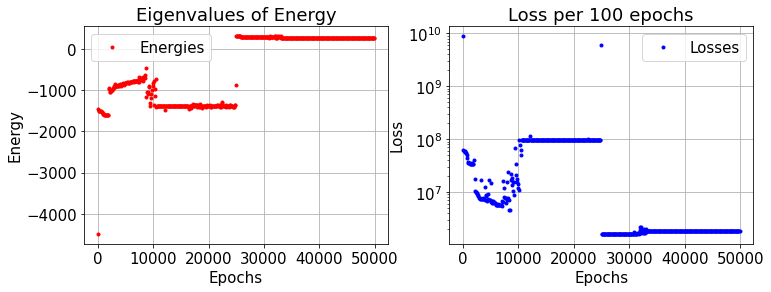

In [31]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs_1, Es_1, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs_1, lss_1, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

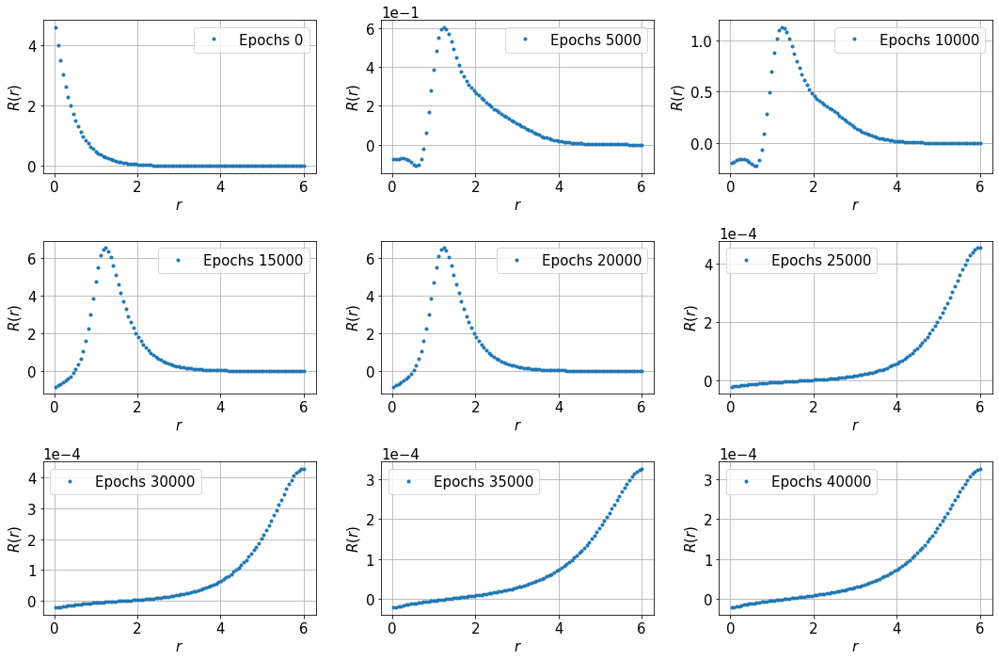

In [32]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t_1[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [33]:
Es_1

array([-4490.9976 , -1448.8663 , -1493.66   , -1499.5892 , -1506.0979 ,
       -1510.1967 , -1513.508  , -1519.7822 , -1538.2277 , -1571.0715 ,
       -1585.1168 , -1587.4962 , -1589.5239 , -1591.0146 , -1592.7075 ,
       -1594.601  , -1596.7415 , -1600.8727 , -1599.7698 , -1599.865  ,
        -961.26624,  -935.99316, -1045.702  , -1031.5587 , -1016.42975,
       -1000.3537 ,  -983.1893 ,  -964.75134,  -944.7982 ,  -923.0674 ,
        -899.187  ,  -921.20416,  -834.4367 ,  -895.13184,  -898.1946 ,
        -892.47314,  -894.8926 ,  -870.7987 ,  -882.50696,  -873.73883,
        -873.32983,  -851.8424 ,  -891.8698 ,  -852.04285,  -848.77106,
        -832.5828 ,  -849.90485,  -864.12024,  -840.98975,  -827.65753,
        -825.0524 ,  -829.0149 ,  -821.335  ,  -804.32794,  -799.5682 ,
        -813.6432 ,  -821.30994,  -811.57825,  -806.46655,  -798.04614,
        -794.3987 ,  -794.0893 ,  -801.1083 ,  -778.713  ,  -780.1998 ,
        -790.3095 ,  -783.1933 ,  -764.74567,  -778.324  ,  -771